# Read the Dataset

In [1]:
import pandas as pd

In [42]:
data=pd.read_csv('csv_files\\flipkart_dataset.csv')
data

,Names,Dates,Review,comment,Place
0,Rakesh Singh,6 months ago,Perfect product!,Very nice poco phone. I am happy this product....,"Certified Buyer, Siwan District"
1,Kavi Lama,"Jan, 2022",Good choice,"This is best budget phone.... Poco C31, and or...","Certified Buyer, Gwalior"
2,Dibakar Nath,11 months ago,Awesome,Very good quality phone but camera quality is ...,"Certified Buyer, Guwahati"
3,Ankita Das,11 months ago,Terrific,"In this budget it's a good phone , everything ...","Certified Buyer, New Delhi"
4,MOKIM SARKAR,"Oct, 2021",Does the job,Pros : 1. Colour and design.2. Big display at ...,"Certified Buyer, Hooghly"
...,...,...,...,...,...
9985,Vinay Pavithra,9 months ago,Worth every penny,Super performance,"Certified Buyer, Chittoor District"
9986,Ashwin Srivastava,9 months ago,Worst experience ever!,Best price with best phonePoco C31,"Certified Buyer, Lucknow"
9987,Yalamarthi krishnakanth,9 months ago,Just okay,Good,"Certified Buyer, Visakhapatnam"
9988,Suraj Giri,9 months ago,Mind-blowing purchase,Very nice phone poco c31,"Certified Buyer, Thane"


# Data Preprocessing

In [3]:
#removing punctuations

import string
def remove_punctuation(text):
    txt_nopunt = "".join([c for c in text if c not in string.punctuation])
    return txt_nopunt
data['comment'] = data['comment'].apply(lambda x: remove_punctuation(x))
print(data['comment'])

0       Very nice poco phone I am happy this product  ...
1       This is best budget phone Poco C31 and order t...
2       Very good quality phone but camera quality is ...
3       In this budget its a good phone  everything is...
4       Pros  1 Colour and design2 Big display at low ...
                              ...                        
9985                                    Super performance
9986                   Best price with best phonePoco C31
9987                                                 Good
9988                             Very nice phone poco c31
9989                                          niceproduct
Name: comment, Length: 9990, dtype: object


In [4]:
#tokentization
import re
def tokenize(txt):
    tokens=re.split('\W+', txt)
    return tokens
data['comment']= data['comment'].apply(lambda x: tokenize(x.lower()))
print(data)

                         Names          Dates                  Review  \
0               Rakesh  Singh    6 months ago        Perfect product!   
1                    Kavi Lama      Jan, 2022             Good choice   
2                 Dibakar Nath  11 months ago                 Awesome   
3                   Ankita Das  11 months ago                Terrific   
4                 MOKIM SARKAR      Oct, 2021            Does the job   
...                        ...            ...                     ...   
9985           Vinay  Pavithra   9 months ago       Worth every penny   
9986         Ashwin Srivastava   9 months ago  Worst experience ever!   
9987  Yalamarthi  krishnakanth   9 months ago               Just okay   
9988               Suraj  Giri   9 months ago   Mind-blowing purchase   
9989                FAHAD KHAN   9 months ago               Brilliant   

                                                comment  \
0     [very, nice, poco, phone, i, am, happy, this, ...   
1    

In [5]:
# removing stop words

import nltk
stopwords = nltk.corpus.stopwords.words('english')
def remove_stopwords(text_tokenized):
    txt_clean=[word for word in text_tokenized if word not in stopwords]
    return txt_clean
data['comment']= data['comment'].apply(lambda x: remove_stopwords(x))

print(data)


                         Names          Dates                  Review  \
0               Rakesh  Singh    6 months ago        Perfect product!   
1                    Kavi Lama      Jan, 2022             Good choice   
2                 Dibakar Nath  11 months ago                 Awesome   
3                   Ankita Das  11 months ago                Terrific   
4                 MOKIM SARKAR      Oct, 2021            Does the job   
...                        ...            ...                     ...   
9985           Vinay  Pavithra   9 months ago       Worth every penny   
9986         Ashwin Srivastava   9 months ago  Worst experience ever!   
9987  Yalamarthi  krishnakanth   9 months ago               Just okay   
9988               Suraj  Giri   9 months ago   Mind-blowing purchase   
9989                FAHAD KHAN   9 months ago               Brilliant   

                                                comment  \
0     [nice, poco, phone, happy, product, color, bea...   
1    

In [6]:
wn=nltk.WordNetLemmatizer()
#lemmatization

def lemmatization(txt):
    lemmed = [wn.lemmatize(word) for word in txt]
    return lemmed

data['comment']=data['comment'].apply(lambda x: lemmatization(x))
print(data)

                         Names          Dates                  Review  \
0               Rakesh  Singh    6 months ago        Perfect product!   
1                    Kavi Lama      Jan, 2022             Good choice   
2                 Dibakar Nath  11 months ago                 Awesome   
3                   Ankita Das  11 months ago                Terrific   
4                 MOKIM SARKAR      Oct, 2021            Does the job   
...                        ...            ...                     ...   
9985           Vinay  Pavithra   9 months ago       Worth every penny   
9986         Ashwin Srivastava   9 months ago  Worst experience ever!   
9987  Yalamarthi  krishnakanth   9 months ago               Just okay   
9988               Suraj  Giri   9 months ago   Mind-blowing purchase   
9989                FAHAD KHAN   9 months ago               Brilliant   

                                                comment  \
0     [nice, poco, phone, happy, product, color, bea...   
1    

In [7]:
#updating the file

# df2=data.rename(columns={0: 'Names', 1: 'Dates', 2: 'Rate', 3: 'Review', 4: 'comment', 5: 'Place'})
# df2.to_csv('csv_files\\preproced_withemoji.csv')

# Data Labeling

In [8]:
pip install vaderSentiment


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [9]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


def sentiment_Vader(text):
    over_all_polarity = sid.polarity_scores(text)
    if over_all_polarity['compound'] >= 0.1:
        return "positive"
    else:
        return "negative"
def neg_score(text):
    over_all_polarity = sid.polarity_scores(text)
    return over_all_polarity['neg']
def neu_score(text):
    over_all_polarity = sid.polarity_scores(text)
    return over_all_polarity['neu']
def pos_score(text):
    over_all_polarity = sid.polarity_scores(text)
    return over_all_polarity['pos']
def compound_score(text):
    over_all_polarity = sid.polarity_scores(text)
    return over_all_polarity['compound']

sid = SentimentIntensityAnalyzer()

data_file = pd.read_csv('csv_files/preproced_withemoji.csv')
data_file['pos_score'] = data_file['comment'].apply(lambda x: pos_score(x))
data_file['neg_score'] = data_file['comment'].apply(lambda x: neg_score(x))
data_file['neu_score'] = data_file['comment'].apply(lambda x: neu_score(x))
data_file['compound_score'] = data_file['comment'].apply(lambda x: compound_score(x))
data_file['sentiment_vader'] = data_file['comment'].apply(lambda x: sentiment_Vader(x))

print(data_file)

      Unnamed: 0                     Names          Dates  \
0              0            Rakesh  Singh    6 months ago   
1              1                 Kavi Lama      Jan, 2022   
2              2              Dibakar Nath  11 months ago   
3              3                Ankita Das  11 months ago   
4              4              MOKIM SARKAR      Oct, 2021   
...          ...                       ...            ...   
9985        9985           Vinay  Pavithra   9 months ago   
9986        9986         Ashwin Srivastava   9 months ago   
9987        9987  Yalamarthi  krishnakanth   9 months ago   
9988        9988               Suraj  Giri   9 months ago   
9989        9989                FAHAD KHAN   9 months ago   

                      Review  \
0           Perfect product!   
1                Good choice   
2                    Awesome   
3                   Terrific   
4               Does the job   
...                      ...   
9985       Worth every penny   
9986  Worst

In [10]:
# csv_data = data_file.to_csv('csv_files/vadar_withemoji.csv')

In [11]:
df=data_file

In [12]:
df

,Unnamed: 0,Names,Dates,Review,comment,Place,pos_score,neg_score,neu_score,compound_score,sentiment_vader
0,0,Rakesh Singh,6 months ago,Perfect product!,"['nice', 'poco', 'phone', 'happy', 'product', ...","Certified Buyer, Siwan District",0.704,0.000,0.296,0.9584,positive
1,1,Kavi Lama,"Jan, 2022",Good choice,"['best', 'budget', 'phone', 'poco', 'c31', 'or...","Certified Buyer, Gwalior",0.497,0.000,0.503,0.9501,positive
2,2,Dibakar Nath,11 months ago,Awesome,"['good', 'quality', 'phone', 'camera', 'qualit...","Certified Buyer, Guwahati",0.575,0.000,0.425,0.9732,positive
3,3,Ankita Das,11 months ago,Terrific,"['budget', 'good', 'phone', 'everything', 'goo...","Certified Buyer, New Delhi",0.530,0.000,0.470,0.9743,positive
4,4,MOKIM SARKAR,"Oct, 2021",Does the job,"['pro', '1', 'colour', 'design2', 'big', 'disp...","Certified Buyer, Hooghly",0.158,0.078,0.764,0.6597,positive
...,...,...,...,...,...,...,...,...,...,...,...
9985,9985,Vinay Pavithra,9 months ago,Worth every penny,"['super', 'performance']","Certified Buyer, Chittoor District",0.796,0.000,0.204,0.5994,positive
9986,9986,Ashwin Srivastava,9 months ago,Worst experience ever!,"['best', 'price', 'best', 'phonepoco', 'c31']","Certified Buyer, Lucknow",0.737,0.000,0.263,0.8555,positive
9987,9987,Yalamarthi krishnakanth,9 months ago,Just okay,['good'],"Certified Buyer, Visakhapatnam",1.000,0.000,0.000,0.4404,positive
9988,9988,Suraj Giri,9 months ago,Mind-blowing purchase,"['nice', 'phone', 'poco', 'c31']","Certified Buyer, Thane",0.483,0.000,0.517,0.4215,positive


In [13]:
from sklearn.preprocessing import LabelEncoder

cat_cols=['sentiment_vader']
le=LabelEncoder()
for i in cat_cols:
    df['target']=le.fit_transform(df[i])

In [14]:
df

,Unnamed: 0,Names,Dates,Review,comment,Place,pos_score,neg_score,neu_score,compound_score,sentiment_vader,target
0,0,Rakesh Singh,6 months ago,Perfect product!,"['nice', 'poco', 'phone', 'happy', 'product', ...","Certified Buyer, Siwan District",0.704,0.000,0.296,0.9584,positive,1
1,1,Kavi Lama,"Jan, 2022",Good choice,"['best', 'budget', 'phone', 'poco', 'c31', 'or...","Certified Buyer, Gwalior",0.497,0.000,0.503,0.9501,positive,1
2,2,Dibakar Nath,11 months ago,Awesome,"['good', 'quality', 'phone', 'camera', 'qualit...","Certified Buyer, Guwahati",0.575,0.000,0.425,0.9732,positive,1
3,3,Ankita Das,11 months ago,Terrific,"['budget', 'good', 'phone', 'everything', 'goo...","Certified Buyer, New Delhi",0.530,0.000,0.470,0.9743,positive,1
4,4,MOKIM SARKAR,"Oct, 2021",Does the job,"['pro', '1', 'colour', 'design2', 'big', 'disp...","Certified Buyer, Hooghly",0.158,0.078,0.764,0.6597,positive,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9985,9985,Vinay Pavithra,9 months ago,Worth every penny,"['super', 'performance']","Certified Buyer, Chittoor District",0.796,0.000,0.204,0.5994,positive,1
9986,9986,Ashwin Srivastava,9 months ago,Worst experience ever!,"['best', 'price', 'best', 'phonepoco', 'c31']","Certified Buyer, Lucknow",0.737,0.000,0.263,0.8555,positive,1
9987,9987,Yalamarthi krishnakanth,9 months ago,Just okay,['good'],"Certified Buyer, Visakhapatnam",1.000,0.000,0.000,0.4404,positive,1
9988,9988,Suraj Giri,9 months ago,Mind-blowing purchase,"['nice', 'phone', 'poco', 'c31']","Certified Buyer, Thane",0.483,0.000,0.517,0.4215,positive,1


In [15]:
# csv_data = df.to_csv('csv_files\\vadar_2_withoutemoji.csv')

In [16]:
#df1=pd.read_csv('csv_files\\vadar_2_withemoji.csv')
df1=df

In [17]:
d=df1['comment']

# Feature Vectorization

# Word2Vec 

In [19]:
from gensim.models import Word2Vec

In [20]:
import numpy as np
# Train the CBOW model
embedding_dim = 100  # Dimensionality of the word embeddings
window_size = 5  # Context window size
model = Word2Vec(d, window=window_size, sg=0, min_count=1)

# Function to get the feature vector for a review
def get_review_vector(review):
    vectors = [model.wv[word] for word in review if word in model.wv]
    if vectors:
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(embedding_dim)

# Get feature vectors for all reviews
review_vectors = [get_review_vector(review) for review in d]

# Print the feature vectors
for i, vector in enumerate(review_vectors):
    print(f"Review {i+1} vector: {vector}")

Review 1 vector: [ 0.45822757 -0.2003258  -0.26541388 -0.26107287  0.27940068  0.2200052
 -0.36644801 -0.62218624  0.5047211   0.5016368   0.11567801  0.46130347
  0.13708735 -0.4223932  -0.14105038  0.15359215 -0.0352595  -0.43422133
  0.628775    0.44671142 -0.01141106 -0.34380376 -0.03219182  0.07353254
 -0.07003755 -0.1323648  -0.1551216  -0.00303963  0.52654546 -0.00263255
  0.12331911  0.31147584 -0.02037092  0.401378    0.18638408 -0.18529998
 -0.61733323  0.06652986 -0.13213582 -0.2470626  -0.14272664  0.09301899
  0.34723836 -0.03557244 -0.2933207   0.23285884  0.19221382 -0.08535699
 -0.21116251  0.04728905  0.11958206  0.09919652 -0.04968967  0.02228174
 -0.02052371 -0.26486662 -0.45531934  0.08292183  0.06511822 -0.22899371
 -0.16392612  0.11590482  0.04207647  0.38823804 -0.15432622 -0.34270355
  0.02330034 -0.04178282  0.29070857 -0.12056926  0.09267078 -0.02892733
  0.10500495  0.25193265 -0.00798862 -0.21555597  0.04859328  0.15641838
  0.10479782  0.13313104 -0.0185695

Review 167 vector: [ 0.46025175 -0.16529809 -0.2713716  -0.2516086   0.28124508  0.22485718
 -0.37538275 -0.6423518   0.5317054   0.54873043  0.0934883   0.4556191
  0.16578032 -0.45830825 -0.1672533   0.15573707 -0.02914869 -0.47411367
  0.6998025   0.4976047  -0.01275717 -0.32360828 -0.08793259  0.08368771
 -0.07119282 -0.13913205 -0.17915328 -0.00207854  0.5958235  -0.04573308
  0.13422398  0.31931874 -0.0651485   0.4198341   0.16588093 -0.21402994
 -0.6109008   0.09258951 -0.1296587  -0.2462388  -0.11014643  0.11013029
  0.36777383 -0.08102634 -0.33151114  0.2414401   0.16169456 -0.08046397
 -0.23493122  0.03598103  0.15919888  0.13042012 -0.04289795  0.0452277
 -0.02323275 -0.29508314 -0.44294     0.06507856  0.06349403 -0.25599244
 -0.19605975  0.12132247  0.04513996  0.43360037 -0.12787671 -0.38362184
  0.01923484 -0.06945322  0.30962965 -0.13719721  0.0843543  -0.04004145
  0.11863511  0.20605901 -0.02476861 -0.24199009  0.04652772  0.14662929
  0.12063521  0.1976736   0.001245

Review 484 vector: [ 0.5001661  -0.2687884  -0.2312612  -0.3745708   0.27712548  0.28703853
 -0.41067222 -0.68284726  0.57916933  0.5628017   0.08185183  0.52265745
  0.10358474 -0.48707098 -0.20440184  0.18157496 -0.07433734 -0.4589528
  0.67964107  0.4785318  -0.03514602 -0.35102996 -0.00488679  0.096297
 -0.11894123 -0.09556879 -0.10673213 -0.07039562  0.5760002   0.02945614
  0.07926378  0.37067008 -0.05731018  0.40784013  0.2129208  -0.23169138
 -0.68711257  0.0179415  -0.1667536  -0.2880594  -0.13826504  0.11675145
  0.37748376 -0.0948736  -0.31055605  0.22511853  0.23397249 -0.10232864
 -0.26256767  0.03429585  0.11200736  0.08128043 -0.02837525  0.02788114
 -0.03480128 -0.2913554  -0.53438205  0.06928975  0.05040506 -0.26882622
 -0.15406244  0.08836175  0.01767987  0.4435495  -0.14336309 -0.37294295
  0.01898248 -0.07315014  0.29509574 -0.12010628  0.10348049 -0.00686887
  0.09919351  0.2566571  -0.05494017 -0.24624765  0.07444698  0.10205776
  0.11295222  0.17419992  0.0262199

Review 646 vector: [ 5.14165640e-01 -2.17028558e-01 -2.56506950e-01 -2.06615239e-01
  2.74985552e-01  2.67443866e-01 -4.02471155e-01 -6.91381693e-01
  5.28539300e-01  5.52957058e-01  1.05250850e-01  4.33775008e-01
  1.84463307e-01 -3.70142102e-01 -1.61977410e-01  9.79934037e-02
 -5.07358424e-02 -3.99434030e-01  6.60663664e-01  4.63806987e-01
 -4.42930497e-02 -3.27992052e-01 -1.69928536e-01  5.19909523e-02
 -5.72893114e-05 -1.48733929e-01 -2.48113573e-01 -6.63083093e-03
  5.05356073e-01 -6.23004287e-02  1.37815014e-01  2.92521685e-01
  1.45184519e-02  4.95631665e-01  1.20158210e-01 -2.02642575e-01
 -7.08327055e-01  1.02086812e-01 -4.85528447e-02 -3.24669629e-01
 -1.56283081e-01  1.32016331e-01  3.64855677e-01 -1.44754769e-02
 -3.99616629e-01  2.16241658e-01  1.32316262e-01 -9.60388929e-02
 -2.67193437e-01  7.26076812e-02  9.68380123e-02  1.39460027e-01
 -2.98113115e-02  4.66843396e-02  4.83125784e-02 -3.24199557e-01
 -4.78167146e-01  6.98421001e-02  9.23506245e-02 -2.27932110e-01
 -2.04

Review 821 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.18316655

Review 1012 vector: [ 0.48157227 -0.25687367 -0.22832334 -0.284424    0.27430645  0.28375903
 -0.38269433 -0.6439403   0.5110342   0.52358717  0.10976468  0.49543256
  0.1208169  -0.38042632 -0.1947414   0.13629118 -0.0229899  -0.392126
  0.58870095  0.3828002  -0.01794479 -0.3693389   0.00095739  0.08695064
 -0.06693252 -0.08590158 -0.13822494 -0.03874445  0.4680943   0.05721457
  0.10134766  0.3375324   0.00867895  0.38507804  0.20368962 -0.17165248
 -0.71138895 -0.01421421 -0.14481911 -0.29836324 -0.14944904  0.08565104
  0.33620167 -0.0165453  -0.2919      0.23052445  0.19780596 -0.13465162
 -0.24660432  0.04430917  0.07016599  0.08542268 -0.070571    0.01048015
 -0.004058   -0.3091493  -0.5328924   0.05318023  0.04005026 -0.24135327
 -0.1460156   0.10107642 -0.02138273  0.3726204  -0.15529275 -0.3395322
  0.02866653 -0.03391024  0.28500748 -0.13732247  0.12059754  0.01348719
  0.05864545  0.2583049  -0.00697264 -0.23623835  0.08682167  0.1385264
  0.13211124  0.12601137 -0.0338684

Review 1247 vector: [ 0.49815738 -0.17094901 -0.2541123  -0.17893769  0.2979288   0.2525478
 -0.34097776 -0.64017457  0.42783192  0.5031916   0.09548701  0.3364915
  0.13103789 -0.383924   -0.12183195  0.19741137 -0.14566946 -0.323434
  0.5908021   0.43384847 -0.05243516 -0.27436015 -0.10863279 -0.02311815
 -0.01717904 -0.15471736 -0.16136129 -0.04049359  0.4850191  -0.09492959
  0.14767586  0.20959204  0.05051928  0.49485344  0.12290671 -0.22612289
 -0.59288883  0.20959619 -0.04332457 -0.27923486 -0.1569701   0.11828628
  0.28955808  0.05049481 -0.32511604  0.27199042  0.16428065 -0.04315746
 -0.22921555  0.05447705  0.04450427  0.07918706  0.0552106   0.01872675
  0.00221153 -0.26183894 -0.45186296  0.07622083  0.10504472 -0.2246339
 -0.1762617   0.13968652  0.03913423  0.3271068  -0.2340156  -0.30278316
 -0.01083426 -0.07409175  0.32777262 -0.10645764  0.00699551 -0.06649934
  0.1433147   0.25781152 -0.03706541 -0.18051828  0.00940098  0.02834214
  0.04575428  0.04513153 -0.03146178

Review 1461 vector: [ 0.45412618 -0.21026242 -0.21941566 -0.22889428  0.27762777  0.24964932
 -0.3578009  -0.59827006  0.48537382  0.48372382  0.12800774  0.44962353
  0.15867321 -0.36214754 -0.15232643  0.11513461  0.01121333 -0.39203912
  0.54885507  0.3532753  -0.01003353 -0.34644207 -0.00901878  0.06650581
 -0.07157779 -0.09499094 -0.16086958  0.00944102  0.4501865   0.05067592
  0.11336324  0.28843006  0.00241375  0.3688517   0.17970128 -0.14722788
 -0.6528454   0.00658858 -0.14781503 -0.25510523 -0.1354905   0.08444721
  0.30862695  0.00131761 -0.2812347   0.21236847  0.17954876 -0.1360465
 -0.22165708  0.05764535  0.09768911  0.07740013 -0.07790025 -0.00098075
 -0.01168761 -0.2751971  -0.475688    0.07456566  0.04942632 -0.22427166
 -0.16810034  0.09860132  0.00742651  0.3540389  -0.16692916 -0.30440423
  0.02514044 -0.01986089  0.26630658 -0.12915657  0.1196227   0.01366062
  0.07762392  0.24665982 -0.00365322 -0.21510234  0.08647236  0.15715669
  0.11436019  0.12001262 -0.0783

Review 1632 vector: [ 0.53042006 -0.27927887 -0.24237236 -0.30774108  0.32214     0.2918047
 -0.3921012  -0.70566416  0.57238585  0.54089934  0.12001633  0.46499583
  0.1278263  -0.47070587 -0.13342611  0.19477606 -0.1263713  -0.45989838
  0.68389946  0.51321024 -0.02997868 -0.3291756  -0.02130561  0.03942641
 -0.08451397 -0.11143303 -0.13306227 -0.0276598   0.5546868  -0.01577138
  0.08570226  0.31684598 -0.00409299  0.43947968  0.19195218 -0.25778
 -0.6702995   0.11729066 -0.13260393 -0.27521533 -0.16549058  0.13223304
  0.3363085  -0.01319352 -0.31639904  0.22552368  0.22989906 -0.0661324
 -0.2483265   0.05718246  0.09416243  0.07287233  0.02211333 -0.01687741
 -0.01882977 -0.26540804 -0.5397435   0.11679759  0.11523968 -0.261083
 -0.19956465  0.09905586  0.05235453  0.41424277 -0.23202199 -0.34182566
  0.00434629 -0.05780191  0.29655161 -0.09057955  0.06422158 -0.01058093
  0.12380347  0.2775173  -0.06682251 -0.23740712  0.03284197  0.06173006
  0.05933045  0.08942433 -0.04180151 -

Review 1812 vector: [ 0.37902477 -0.09644507 -0.20735954 -0.14864671  0.2509992   0.16449523
 -0.30083162 -0.46902618  0.37847236  0.3742195   0.13937181  0.33870235
  0.17300211 -0.3335161  -0.06406519  0.11175437  0.02858051 -0.30803373
  0.43898088  0.25833023 -0.01806403 -0.29431513 -0.00481338  0.03218349
 -0.07274008 -0.11773399 -0.16408266  0.05357705  0.39342692  0.03474787
  0.12724602  0.19261393  0.03863846  0.3576242   0.14221673 -0.108733
 -0.507669    0.07072479 -0.13639651 -0.17119932 -0.13470691  0.07941713
  0.2430577   0.06331535 -0.2468646   0.17546299  0.17124268 -0.11825064
 -0.17595303  0.0692609   0.11149281  0.04743361 -0.07489008 -0.01946523
 -0.03831793 -0.2018176  -0.3523819   0.09298676  0.07187095 -0.15559015
 -0.17119719  0.08209344  0.09241137  0.29311585 -0.20339167 -0.205504
  0.02695574  0.0013806   0.22134142 -0.0910135   0.08603185 -0.00081574
  0.11604156  0.27078226  0.02056023 -0.09746616  0.08825362  0.16807768
  0.04664664  0.06394162 -0.1276862

Review 1996 vector: [ 0.43077412 -0.17196779 -0.25085497 -0.24802049  0.27753997  0.21720047
 -0.4042799  -0.6213103   0.50133854  0.5249501   0.14823535  0.440656
  0.13365696 -0.38937557 -0.15061118  0.11736639 -0.02868521 -0.3880528
  0.6146641   0.38755992 -0.02838199 -0.3515187  -0.03669339  0.07750039
 -0.04154995 -0.13165589 -0.18411684 -0.00946524  0.47089258 -0.01953304
  0.12697278  0.3064649   0.05589794  0.48889694  0.17951986 -0.15556403
 -0.6791312   0.04894139 -0.1236655  -0.2552018  -0.14986756  0.09503466
  0.33078736  0.01418145 -0.32348707  0.2371871   0.17623809 -0.12615892
 -0.26283514  0.05725335  0.11627273  0.11838315 -0.06395391  0.02973889
  0.00288521 -0.3413133  -0.44488105  0.06555941  0.08540445 -0.198734
 -0.20385596  0.118223    0.03418342  0.3342528  -0.17757285 -0.35456553
  0.03783923 -0.04578356  0.31518912 -0.15406896  0.09411103  0.00667534
  0.06532824  0.2820367   0.07427502 -0.16447738  0.09489402  0.16343391
  0.10742443  0.11972073 -0.0674892 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review 2595 vector: [ 0.40418673 -0.160088   -0.2580391  -0.24796197  0.2513813   0.20662402
 -0.3500361  -0.56476444  0.42965674  0.4609119   0.08901697  0.37906396
  0.06834348 -0.41328257 -0.12960951  0.1690942  -0.09498005 -0.32631162
  0.5744173   0.3763972  -0.05031909 -0.28758645 -0.03086532  0.05531181
 -0.06230846 -0.13410887 -0.141958   -0.02327898  0.46661276 -0.03165949
  0.11082051  0.26248378  0.04567104  0.4613307   0.13962844 -0.18722421
 -0.5722435   0.11789309 -0.09727921 -0.2266304  -0.13653299  0.10222981
  0.29097056  0.0192306  -0.2838273   0.2221238   0.19675243 -0.07557365
 -0.20638752  0.03802496  0.07846382  0.06397209  0.00469398  0.03103401
 -0.03070328 -0.24837662 -0.40883768  0.05697471  0.09976783 -0.19176681
 -0.14279097  0.09655843  0.08977482  0.32405856 -0.1925752  -0.29589918
  0.02475048 -0.0519017   0.26175818 -0.09404705  0.03425981 -0.03132856
  0.12191882  0.26271307  0.0095441  -0.12193759  0.05305133  0.09834236
  0.0486309   0.05995955 -0.011

Review 2791 vector: [ 4.78829384e-01 -2.52513409e-01 -2.28487462e-01 -2.86774695e-01
  2.65704125e-01  2.87637860e-01 -3.60093802e-01 -6.24379754e-01
  4.74732816e-01  5.06824136e-01  8.78521875e-02  4.83445704e-01
  1.01265401e-01 -3.71651560e-01 -1.99663401e-01  1.61551386e-01
 -4.12665308e-02 -3.50732476e-01  5.60440242e-01  3.58778119e-01
 -2.35766433e-02 -3.60642165e-01  9.33216978e-03  9.08206403e-02
 -5.98239228e-02 -8.14673901e-02 -1.18730515e-01 -7.34902322e-02
  4.53658462e-01  6.69158548e-02  1.00917250e-01  3.35215449e-01
  2.37372313e-02  3.82319987e-01  2.09403843e-01 -1.76491931e-01
 -7.09575236e-01 -4.83577279e-03 -1.28912419e-01 -3.12618256e-01
 -1.65193930e-01  8.80509093e-02  3.22340071e-01 -1.12705734e-02
 -2.90538162e-01  2.33266622e-01  2.13740155e-01 -1.24447666e-01
 -2.48070776e-01  4.06128131e-02  4.15985100e-02  7.81957582e-02
 -6.81828856e-02  9.33699124e-03  5.18589048e-03 -2.99656659e-01
 -5.45089424e-01  3.61799188e-02  2.93102860e-02 -2.36681640e-01
 -1.2

Review 2961 vector: [ 0.49815738 -0.17094901 -0.2541123  -0.17893769  0.2979288   0.2525478
 -0.34097776 -0.64017457  0.42783192  0.5031916   0.09548701  0.3364915
  0.13103789 -0.383924   -0.12183195  0.19741137 -0.14566946 -0.323434
  0.5908021   0.43384847 -0.05243516 -0.27436015 -0.10863279 -0.02311815
 -0.01717904 -0.15471736 -0.16136129 -0.04049359  0.4850191  -0.09492959
  0.14767586  0.20959204  0.05051928  0.49485344  0.12290671 -0.22612289
 -0.59288883  0.20959619 -0.04332457 -0.27923486 -0.1569701   0.11828628
  0.28955808  0.05049481 -0.32511604  0.27199042  0.16428065 -0.04315746
 -0.22921555  0.05447705  0.04450427  0.07918706  0.0552106   0.01872675
  0.00221153 -0.26183894 -0.45186296  0.07622083  0.10504472 -0.2246339
 -0.1762617   0.13968652  0.03913423  0.3271068  -0.2340156  -0.30278316
 -0.01083426 -0.07409175  0.32777262 -0.10645764  0.00699551 -0.06649934
  0.1433147   0.25781152 -0.03706541 -0.18051828  0.00940098  0.02834214
  0.04575428  0.04513153 -0.03146178

Review 3128 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.1831665

Review 3341 vector: [ 0.49815738 -0.17094901 -0.2541123  -0.17893769  0.2979288   0.2525478
 -0.34097776 -0.64017457  0.42783192  0.5031916   0.09548701  0.3364915
  0.13103789 -0.383924   -0.12183195  0.19741137 -0.14566946 -0.323434
  0.5908021   0.43384847 -0.05243516 -0.27436015 -0.10863279 -0.02311815
 -0.01717904 -0.15471736 -0.16136129 -0.04049359  0.4850191  -0.09492959
  0.14767586  0.20959204  0.05051928  0.49485344  0.12290671 -0.22612289
 -0.59288883  0.20959619 -0.04332457 -0.27923486 -0.1569701   0.11828628
  0.28955808  0.05049481 -0.32511604  0.27199042  0.16428065 -0.04315746
 -0.22921555  0.05447705  0.04450427  0.07918706  0.0552106   0.01872675
  0.00221153 -0.26183894 -0.45186296  0.07622083  0.10504472 -0.2246339
 -0.1762617   0.13968652  0.03913423  0.3271068  -0.2340156  -0.30278316
 -0.01083426 -0.07409175  0.32777262 -0.10645764  0.00699551 -0.06649934
  0.1433147   0.25781152 -0.03706541 -0.18051828  0.00940098  0.02834214
  0.04575428  0.04513153 -0.03146178

Review 3491 vector: [ 0.465637   -0.18868667 -0.26791218 -0.2655026   0.2617497   0.21821673
 -0.35204765 -0.64374644  0.45281452  0.4742297   0.13679862  0.44519
  0.12587094 -0.46264738 -0.13488486  0.22630565 -0.06645293 -0.43131188
  0.5940635   0.41628665 -0.01630875 -0.31831515  0.03306634  0.03791643
 -0.13224843 -0.14182775 -0.10424414 -0.02101969  0.5258816   0.01013386
  0.11050367  0.29474908  0.014622    0.43203175  0.18166202 -0.15445894
 -0.5900936   0.09520331 -0.17589657 -0.2100985  -0.11690018  0.10734459
  0.3081566  -0.01457539 -0.24473909  0.2722841   0.21584639 -0.07820962
 -0.1955324   0.0482966   0.07058009  0.07317405 -0.01393416  0.01782828
 -0.05402149 -0.2258345  -0.4684408   0.08760677  0.07319155 -0.23541297
 -0.14178532  0.08637293  0.05794603  0.37095132 -0.1941002  -0.31070065
 -0.03348343 -0.03594165  0.28659517 -0.10354325  0.05934301 -0.03835107
  0.144161    0.3118423  -0.06402027 -0.18951042  0.06439286  0.10248386
  0.07878131  0.09435663 -0.007393

Review 3675 vector: [ 0.43081734 -0.19749928 -0.23425427 -0.30840543  0.22793455  0.22161117
 -0.4015461  -0.582691    0.461652    0.4760809   0.11665473  0.45526385
  0.06172093 -0.40410802 -0.15250579  0.14821975 -0.06624549 -0.31206828
  0.5647435   0.34451234 -0.04907085 -0.3616202   0.0256697   0.07986365
 -0.06846202 -0.10976698 -0.10867521 -0.04129061  0.4462422   0.02712289
  0.08903029  0.3183321   0.07061563  0.423824    0.19846238 -0.1677455
 -0.62461424  0.02322375 -0.1454454  -0.24795042 -0.16216294  0.07461601
  0.32849544  0.03533617 -0.26243114  0.21285033  0.20974001 -0.11590929
 -0.23720497  0.02986788  0.064367    0.06816467 -0.04460221  0.01503389
 -0.05086354 -0.29832956 -0.4556191   0.05306107  0.075694   -0.17216161
 -0.11592562  0.08257964  0.07622201  0.33838165 -0.18383105 -0.27454978
  0.05567666 -0.01250178  0.2550521  -0.10775344  0.079593    0.01158466
  0.07476792  0.32994536  0.07084686 -0.09638334  0.1005041   0.15421811
  0.06844889  0.06814243 -0.0309

Review 3866 vector: [ 0.43081734 -0.19749928 -0.23425427 -0.30840543  0.22793455  0.22161117
 -0.4015461  -0.582691    0.461652    0.4760809   0.11665473  0.45526385
  0.06172093 -0.40410802 -0.15250579  0.14821975 -0.06624549 -0.31206828
  0.5647435   0.34451234 -0.04907085 -0.3616202   0.0256697   0.07986365
 -0.06846202 -0.10976698 -0.10867521 -0.04129061  0.4462422   0.02712289
  0.08903029  0.3183321   0.07061563  0.423824    0.19846238 -0.1677455
 -0.62461424  0.02322375 -0.1454454  -0.24795042 -0.16216294  0.07461601
  0.32849544  0.03533617 -0.26243114  0.21285033  0.20974001 -0.11590929
 -0.23720497  0.02986788  0.064367    0.06816467 -0.04460221  0.01503389
 -0.05086354 -0.29832956 -0.4556191   0.05306107  0.075694   -0.17216161
 -0.11592562  0.08257964  0.07622201  0.33838165 -0.18383105 -0.27454978
  0.05567666 -0.01250178  0.2550521  -0.10775344  0.079593    0.01158466
  0.07476792  0.32994536  0.07084686 -0.09638334  0.1005041   0.15421811
  0.06844889  0.06814243 -0.0309

Review 4041 vector: [ 0.47878858 -0.22840033 -0.2441659  -0.22974446  0.31255364  0.28347218
 -0.36267573 -0.66085345  0.51221454  0.55297834  0.11767834  0.46964943
  0.16920498 -0.35773757 -0.19787404  0.13241209 -0.00579292 -0.42249563
  0.60758746  0.39943415 -0.00403716 -0.35110185 -0.0495663   0.08858868
 -0.03440697 -0.10214026 -0.18998094 -0.04343294  0.47693935  0.02285193
  0.13675182  0.32400754  0.0098372   0.44377777  0.19151369 -0.16498718
 -0.7610635   0.0194531  -0.10834253 -0.31946677 -0.15358162  0.10733518
  0.32450464 -0.03125004 -0.3482021   0.25625134  0.18209946 -0.13412787
 -0.272277    0.06647687  0.0906206   0.12562434 -0.08645949  0.02322505
  0.0559486  -0.34025246 -0.53494793  0.0479839   0.03848126 -0.26177782
 -0.21061389  0.13187103 -0.07332838  0.35728768 -0.15159504 -0.40897802
  0.00646063 -0.07802626  0.34361124 -0.17216021  0.12351814 -0.00420252
  0.04782371  0.22077137 -0.02296273 -0.28954366  0.07730722  0.12011911
  0.16363147  0.15875998 -0.044

Review 4234 vector: [ 4.21473682e-01 -1.83977604e-01 -2.34994233e-01 -3.15193266e-01
  2.05681145e-01  2.26454362e-01 -3.51873249e-01 -5.34851909e-01
  3.76887619e-01  4.35395062e-01  6.77822456e-02  4.25782859e-01
  1.40364934e-02 -3.85844767e-01 -1.60940558e-01  2.05800697e-01
 -1.10071383e-01 -2.13929206e-01  4.99659389e-01  2.88069665e-01
 -6.36878982e-02 -3.41570228e-01  4.60574664e-02  8.81282091e-02
 -5.25632501e-02 -1.01281628e-01 -6.29658177e-02 -1.19627744e-01
  4.12396044e-01  4.70700674e-02  8.72920230e-02  3.11918974e-01
  1.08367801e-01  4.20039862e-01  2.10992619e-01 -1.78390086e-01
 -6.15109980e-01  4.66651209e-02 -1.09694518e-01 -2.76873499e-01
 -1.98383600e-01  7.93260336e-02  2.96825200e-01  5.04468903e-02
 -2.57525176e-01  2.17915565e-01  2.46337891e-01 -9.17790681e-02
 -2.39916995e-01  2.06484925e-02 -2.72297300e-04  5.08254804e-02
 -3.76058631e-02  1.27463937e-02 -3.29901204e-02 -2.76294708e-01
 -4.78232890e-01  1.48029141e-02  5.37567921e-02 -1.57325894e-01
 -7.2

Review 4413 vector: [ 0.53230935 -0.21039635 -0.26374817 -0.22031985  0.2480775   0.24702968
 -0.39174935 -0.66542155  0.50527966  0.5308209   0.14331204  0.50611997
  0.19688785 -0.37714428 -0.1651353   0.18934868  0.03582978 -0.42819545
  0.643714    0.39959237 -0.01319818 -0.3703346  -0.08630411  0.02956504
 -0.07405373 -0.12156428 -0.18912882  0.00153218  0.52954096  0.03044283
  0.08433171  0.36778992  0.04162794  0.51343614  0.16540267 -0.17190014
 -0.76084095  0.00513667 -0.16871345 -0.25494853 -0.17180604  0.17312704
  0.38844097 -0.00766713 -0.3396931   0.28195372  0.20589037 -0.1466828
 -0.28504363  0.06538849  0.05512477  0.17062287 -0.10733302  0.01935484
  0.03379846 -0.32284713 -0.5410705   0.09372406  0.10502799 -0.21830489
 -0.21500936  0.09087098 -0.06325195  0.3858097  -0.16732511 -0.37543964
 -0.00113779 -0.12321562  0.3445428  -0.13859496  0.0841253  -0.01279436
  0.03718587  0.23579635  0.0166073  -0.20606406  0.14379497  0.15964098
  0.13539596  0.13809577 -0.0695

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review 5439 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.1831665

Review 5648 vector: [ 0.43051353 -0.1741025  -0.26917413 -0.26490483  0.276712    0.22709697
 -0.33859125 -0.58564353  0.46531886  0.4838589   0.10682998  0.42298052
  0.07184187 -0.42419207 -0.17390178  0.18326499 -0.05505135 -0.3899981
  0.59093404  0.3786177  -0.01444584 -0.31007946  0.01191454  0.07774559
 -0.08873539 -0.12320628 -0.13239163 -0.03277155  0.49699783  0.01593844
  0.08711826  0.29818007  0.03668035  0.41843075  0.16429962 -0.17997533
 -0.6184983   0.06899662 -0.13822833 -0.24581574 -0.15071474  0.09948242
  0.30716953 -0.00125513 -0.2731018   0.2560177   0.21296085 -0.09604689
 -0.20587252  0.049537    0.0741218   0.07461572 -0.03024769  0.01922906
 -0.02332965 -0.27089715 -0.44860664  0.05439908  0.06313265 -0.21421003
 -0.14931649  0.07204939  0.04763775  0.35206386 -0.16841711 -0.33535674
  0.01477891 -0.04796068  0.26470208 -0.094791    0.05579165 -0.02279416
  0.11551725  0.25643936 -0.03181018 -0.19445358  0.06891715  0.115486
  0.09112568  0.09063757 -0.016099

Review 5856 vector: [ 3.57846022e-01 -6.96710646e-02 -2.33975366e-01 -1.05019949e-01
  2.72018045e-01  1.55520275e-01 -2.59923190e-01 -4.63064283e-01
  3.55232805e-01  3.69772762e-01  1.09342776e-01  2.74772108e-01
  1.67910859e-01 -3.50121409e-01 -5.04784323e-02  1.36467278e-01
 -1.01357279e-02 -3.22701752e-01  4.61892843e-01  2.99286842e-01
 -2.25761440e-02 -2.27366120e-01 -5.81396520e-02  1.26506202e-02
 -6.61361963e-02 -1.41237229e-01 -1.91533089e-01  6.16025999e-02
  4.19356972e-01 -2.48371419e-02  1.45013526e-01  1.49999052e-01
  1.70598868e-02  4.02099311e-01  8.93033668e-02 -1.34423539e-01
 -4.67608303e-01  1.60394013e-01 -8.91828462e-02 -1.57958359e-01
 -1.11967072e-01  1.06525548e-01  2.14526281e-01  4.42646034e-02
 -2.69899368e-01  1.88671961e-01  1.62307456e-01 -7.76685327e-02
 -1.51583150e-01  7.32713491e-02  1.20629020e-01  4.54232544e-02
 -2.24056933e-02  1.66376951e-04 -1.94782671e-02 -1.62023827e-01
 -3.16467524e-01  9.26977172e-02  9.63471904e-02 -1.76939741e-01
 -1.9

Review 6025 vector: [ 0.4715378  -0.23193103 -0.24258678 -0.3048238   0.2558831   0.27366215
 -0.40200952 -0.6571683   0.5134652   0.52286273  0.11474475  0.4956638
  0.08742245 -0.42732996 -0.18167049  0.16001646 -0.06097297 -0.38705242
  0.60772157  0.39808026 -0.02604866 -0.35537064  0.01278638  0.08869745
 -0.08249802 -0.09536472 -0.11535425 -0.04578247  0.48082316  0.03695313
  0.07773154  0.34105638  0.03602175  0.40331867  0.20207149 -0.19168237
 -0.6837623   0.02381633 -0.15665841 -0.2710284  -0.14974006  0.09049171
  0.34079865  0.00532708 -0.27288753  0.2239979   0.2015837  -0.11657561
 -0.23996149  0.0344061   0.06234429  0.08999333 -0.03701885  0.0055666
 -0.03566821 -0.30631623 -0.5110109   0.05660565  0.05844358 -0.22145589
 -0.12835039  0.08504304  0.02703761  0.37882257 -0.17000374 -0.32263362
  0.03382774 -0.02112991  0.27588773 -0.12167099  0.08967734  0.00525177
  0.06944322  0.2880146   0.00946665 -0.1788153   0.09324618  0.13622552
  0.10418481  0.09613347 -0.03020

Review 6197 vector: [ 0.49411985 -0.25284487 -0.24192533 -0.31771228  0.2517597   0.25904283
 -0.4013715  -0.66778696  0.5477187   0.544435    0.09817674  0.5224381
  0.1251602  -0.4385126  -0.19101241  0.17740591 -0.01509804 -0.45805135
  0.6789379   0.45367897 -0.01295444 -0.35692254 -0.02515369  0.06849544
 -0.10720173 -0.09308577 -0.13230386 -0.02336863  0.56120604  0.0236505
  0.08675043  0.38115078 -0.04933481  0.40207154  0.1903864  -0.2082275
 -0.6776067  -0.00353504 -0.18393016 -0.25387317 -0.11332358  0.11450693
  0.3933051  -0.07949975 -0.28350598  0.24455158  0.19606572 -0.12137616
 -0.2424396   0.02559446  0.10455797  0.11389737 -0.05355632  0.03100535
 -0.0338673  -0.29381526 -0.51321334  0.07402083  0.06753449 -0.25058725
 -0.15769169  0.07866894  0.00487884  0.44067273 -0.12569779 -0.35221443
  0.018747   -0.06677854  0.2862641  -0.11349232  0.08933683 -0.00236314
  0.08301953  0.23571382 -0.01042487 -0.23824526  0.10244533  0.15695813
  0.1331035   0.1617276  -0.020052

Review 6361 vector: [ 0.4801996  -0.19096825 -0.22294934 -0.24603634  0.25088856  0.24923605
 -0.37369    -0.59762156  0.4807441   0.49989042  0.10942043  0.4364717
  0.11527427 -0.386064   -0.15821873  0.16726719 -0.04632187 -0.3407294
  0.58655316  0.3937337  -0.03816416 -0.32870102 -0.06193499  0.0276546
 -0.05126187 -0.10575889 -0.12671919 -0.02722595  0.4921226  -0.02538908
  0.09979618  0.29393384  0.01594125  0.40746167  0.15802589 -0.22798692
 -0.6043026   0.06434064 -0.11645705 -0.25660935 -0.14807728  0.10674381
  0.3479554   0.00510161 -0.28503406  0.22654617  0.17109591 -0.10076904
 -0.23948929  0.03407445  0.07759652  0.10017782 -0.03421769  0.00687956
 -0.03361355 -0.2991298  -0.45883065  0.06707963  0.07206991 -0.21448982
 -0.1520319   0.09847816  0.0399051   0.37856835 -0.18160354 -0.27230066
  0.04080938 -0.0563697   0.2652514  -0.09365933  0.05355786 -0.01308319
  0.08793847  0.24647094  0.01884419 -0.17418908  0.08990321  0.13468567
  0.08225475  0.09354747 -0.057266

Review 6560 vector: [ 0.46947128 -0.21706475 -0.21473227 -0.26092997  0.28912798  0.24000692
 -0.36646396 -0.57823825  0.4873328   0.49901444  0.10489354  0.40633348
  0.11795524 -0.3736065  -0.16914737  0.14931414 -0.03789409 -0.3659751
  0.591851    0.38301936 -0.03324388 -0.32941267 -0.04098552  0.02487454
 -0.05228609 -0.10476108 -0.15256885 -0.01894294  0.4991473  -0.01101164
  0.12071928  0.27913597 -0.01083089  0.4237005   0.15463045 -0.19063127
 -0.61920506  0.04225666 -0.11323366 -0.2755342  -0.13665733  0.09665114
  0.3300569  -0.02640403 -0.30870637  0.25509182  0.1876482  -0.11127781
 -0.24380602  0.04982796  0.10163269  0.0618672  -0.04281582  0.03530927
 -0.01326134 -0.29112843 -0.45964134  0.06560082  0.06782539 -0.23327164
 -0.18128341  0.10860798  0.02540696  0.36400172 -0.16958472 -0.30756706
  0.02731617 -0.06869501  0.27619222 -0.10499419  0.07688255 -0.00102552
  0.11304066  0.23611246 -0.00755703 -0.22923899  0.06991925  0.11025953
  0.09848889  0.12640937 -0.0432

Review 6770 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.1831665

Review 7041 vector: [ 0.5064539  -0.22737682 -0.21866848 -0.2377628   0.3083756   0.25709873
 -0.3436975  -0.61513793  0.5116264   0.5016408   0.10398219  0.44455153
  0.21381484 -0.35996696 -0.15767935  0.12124833  0.01881663 -0.42428407
  0.6016435   0.40744355  0.00821868 -0.35810632 -0.0562646   0.06640556
 -0.03657189 -0.10772099 -0.2023372  -0.00749368  0.5289459   0.03713457
  0.13341047  0.30812714 -0.03986785  0.37901282  0.18348135 -0.16186889
 -0.67691654  0.0102545  -0.11430148 -0.31094792 -0.16894473  0.11168395
  0.36043358 -0.07046912 -0.3583501   0.23523429  0.20211738 -0.11611985
 -0.26324928  0.07348187  0.12520374  0.09672798 -0.10990783  0.02218109
  0.03628925 -0.28603658 -0.4990635   0.08339598  0.03851897 -0.24836928
 -0.21380992  0.12275302 -0.02330378  0.39073154 -0.15033802 -0.3472838
  0.02484028 -0.07094163  0.29537567 -0.13566628  0.13537326 -0.01989961
  0.09799084  0.22183302 -0.03862627 -0.29076576  0.05412412  0.1405705
  0.11584572  0.19437477 -0.04159

Review 7297 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.1831665

Review 7456 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.1831665

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Review 7735 vector: [ 0.49602526 -0.24788904 -0.22196764 -0.29882464  0.26666692  0.24376652
 -0.40133542 -0.64174956  0.5085597   0.5112015   0.10872304  0.48554122
  0.1493726  -0.40367252 -0.14262418  0.18613276 -0.0382386  -0.40662202
  0.6047473   0.43728733 -0.01014136 -0.35845354 -0.03380836  0.02204612
 -0.06161409 -0.10499077 -0.10402957 -0.04470652  0.52972054 -0.00340663
  0.13412988  0.32100376 -0.05624832  0.38765067  0.20743428 -0.18954864
 -0.61729264  0.03936715 -0.13408156 -0.26521587 -0.12814775  0.09190641
  0.3834791  -0.07790822 -0.2808642   0.24717177  0.19381358 -0.08615001
 -0.23547088  0.03533219  0.11244669  0.0998413  -0.05854713  0.04336173
 -0.03076448 -0.2668691  -0.4829058   0.08325583  0.02782455 -0.257949
 -0.1430857   0.13919465  0.0038453   0.40945074 -0.14018057 -0.3002936
  0.02232936 -0.06906268  0.31036934 -0.11084244  0.09402729 -0.03599856
  0.09193476  0.2677958  -0.01016749 -0.23927152  0.07293905  0.14834522
  0.12683645  0.15782382 -0.013264

Review 7814 vector: [ 0.4627783  -0.19434664 -0.23222944 -0.27610242  0.26897678  0.21901785
 -0.35513923 -0.5765089   0.47016588  0.46045184  0.12735313  0.44099587
  0.10784649 -0.4171802  -0.1312409   0.19225621 -0.03334609 -0.382885
  0.5840762   0.38481283 -0.00225368 -0.34925175  0.04011244  0.03611097
 -0.08606051 -0.09868272 -0.09799121 -0.00985599  0.5123321   0.02835574
  0.09379947  0.30450857  0.00963597  0.35089716  0.20136048 -0.18956809
 -0.5699566   0.04998311 -0.16941026 -0.21974017 -0.14384945  0.0783084
  0.3347191   0.00366382 -0.23705935  0.24859637  0.211942   -0.0938981
 -0.21112187  0.03215731  0.08999722  0.0674984  -0.04933887 -0.00750428
 -0.06563608 -0.25920254 -0.45708135  0.08801421  0.06678691 -0.21019723
 -0.14673042  0.06820628  0.07311844  0.39269066 -0.17896873 -0.2609365
  0.03293484 -0.01035038  0.23951882 -0.06520087  0.06243715 -0.00965481
  0.12495053  0.309698   -0.01705535 -0.18449247  0.07607973  0.14869678
  0.08008635  0.09115228 -0.06520613

Review 8017 vector: [ 4.21473682e-01 -1.83977604e-01 -2.34994233e-01 -3.15193266e-01
  2.05681145e-01  2.26454362e-01 -3.51873249e-01 -5.34851909e-01
  3.76887619e-01  4.35395062e-01  6.77822456e-02  4.25782859e-01
  1.40364934e-02 -3.85844767e-01 -1.60940558e-01  2.05800697e-01
 -1.10071383e-01 -2.13929206e-01  4.99659389e-01  2.88069665e-01
 -6.36878982e-02 -3.41570228e-01  4.60574664e-02  8.81282091e-02
 -5.25632501e-02 -1.01281628e-01 -6.29658177e-02 -1.19627744e-01
  4.12396044e-01  4.70700674e-02  8.72920230e-02  3.11918974e-01
  1.08367801e-01  4.20039862e-01  2.10992619e-01 -1.78390086e-01
 -6.15109980e-01  4.66651209e-02 -1.09694518e-01 -2.76873499e-01
 -1.98383600e-01  7.93260336e-02  2.96825200e-01  5.04468903e-02
 -2.57525176e-01  2.17915565e-01  2.46337891e-01 -9.17790681e-02
 -2.39916995e-01  2.06484925e-02 -2.72297300e-04  5.08254804e-02
 -3.76058631e-02  1.27463937e-02 -3.29901204e-02 -2.76294708e-01
 -4.78232890e-01  1.48029141e-02  5.37567921e-02 -1.57325894e-01
 -7.2

Review 8189 vector: [ 0.49377    -0.24826974 -0.22293124 -0.30564675  0.25824958  0.26032215
 -0.4030737  -0.65533924  0.52776986  0.5249928   0.10292276  0.4827356
  0.14130247 -0.43318507 -0.15523827  0.18233174 -0.05365541 -0.4184726
  0.62560564  0.44232392 -0.03611265 -0.33100608 -0.04876991  0.03628037
 -0.09130056 -0.10838168 -0.12064883 -0.03718753  0.5353004  -0.00454515
  0.09989473  0.32941613 -0.03885905  0.44083497  0.1758208  -0.21021037
 -0.64849496  0.04210652 -0.1443661  -0.2577336  -0.13229135  0.1328023
  0.37085757 -0.07402532 -0.30383486  0.22600125  0.20885372 -0.09652222
 -0.2507502   0.04344552  0.10415039  0.09674474 -0.0363523   0.03499319
 -0.02579106 -0.26847333 -0.49347958  0.08597632  0.06565246 -0.25342244
 -0.16197066  0.10951261  0.01757763  0.40535626 -0.16635245 -0.32170245
  0.00992703 -0.09186664  0.29643416 -0.11009041  0.08247793 -0.01856722
  0.09293627  0.24262722 -0.02308381 -0.21512024  0.08965524  0.11583839
  0.0969528   0.14700145 -0.009719

Review 8366 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.1831665

Review 8552 vector: [ 0.5028451  -0.22226876 -0.2462266  -0.24669835  0.26294512  0.26193964
 -0.38628197 -0.65217865  0.5028985   0.51336735  0.10583189  0.44443882
  0.14769977 -0.37835974 -0.15704031  0.1305838  -0.05785555 -0.3649413
  0.6180654   0.41459087 -0.03969442 -0.3394762  -0.09334821  0.07294947
 -0.01832234 -0.12721096 -0.19879313 -0.0381128   0.486044   -0.0112572
  0.11045161  0.31113482  0.04561432  0.46096504  0.15673068 -0.19562878
 -0.69934756  0.0726914  -0.0773603  -0.31938463 -0.18508413  0.12515944
  0.34797123  0.00169936 -0.36662114  0.207151    0.1777685  -0.098414
 -0.26606727  0.06957766  0.07053355  0.11399927 -0.05007175  0.023833
  0.03428499 -0.31013492 -0.4977891   0.06227803  0.0816412  -0.20801634
 -0.18099348  0.13328153  0.00710143  0.35363606 -0.1905193  -0.34091786
  0.03068241 -0.08225355  0.31762266 -0.1515324   0.10091707 -0.015926
  0.06061313  0.23663864  0.03546966 -0.18253562  0.07018282  0.11647904
  0.08345943  0.11591322 -0.01998704 -0

Review 8720 vector: [ 0.5038178  -0.26873398 -0.21587476 -0.3832655   0.17962047  0.23224056
 -0.49234173 -0.66756     0.525921    0.5690252   0.11588571  0.5809969
  0.12723462 -0.46208382 -0.15782924  0.28078073 -0.05369407 -0.4106018
  0.61818486  0.42923388 -0.08324312 -0.35318607 -0.06502821 -0.02489687
 -0.14856589 -0.11048559 -0.00584152 -0.105916    0.545033   -0.01458944
  0.08711878  0.39358416 -0.05877513  0.5605706   0.21350047 -0.22040883
 -0.6856539  -0.00775997 -0.21321166 -0.21026026 -0.13151893  0.18061258
  0.43090272 -0.11933871 -0.26246595  0.25986436  0.23925297 -0.11023785
 -0.28298444  0.02308146  0.08059346  0.14695103 -0.0585365   0.07594802
 -0.05785972 -0.28096676 -0.52332675  0.08269101  0.05260552 -0.25845245
 -0.12278348  0.11585661 -0.03630433  0.4307675  -0.13878784 -0.3341774
 -0.02627323 -0.18967861  0.38018805 -0.10991651  0.06610029 -0.0102469
  0.02034498  0.27508527  0.02187238 -0.13739619  0.20641711  0.13206278
  0.14996378  0.1597654   0.0342625

Review 8921 vector: [ 0.3114145   0.03076253 -0.17784292  0.02429399  0.25469348  0.105083
 -0.13785495 -0.29331413  0.2001309   0.21893957  0.11605606  0.17808968
  0.25050902 -0.23583692  0.02699574  0.12831181  0.09143388 -0.2053558
  0.23241395  0.1049326   0.00220159 -0.19854704 -0.01871906 -0.01319213
 -0.06165411 -0.11821152 -0.18070666  0.08196603  0.30016354  0.06327314
  0.16850045  0.04476772  0.04041632  0.2793653   0.09147059 -0.05298852
 -0.3666015   0.14760482 -0.09046564 -0.1137774  -0.1400395   0.0895284
  0.11526999  0.10990264 -0.22444633  0.13846746  0.16453111 -0.09675443
 -0.10975657  0.10435866  0.09987008  0.00677198 -0.10196757 -0.06056423
 -0.0063307  -0.07120688 -0.25885388  0.09964503  0.04563279 -0.12211156
 -0.18999128  0.07393616  0.08917898  0.21432708 -0.2321598  -0.10998569
 -0.01572588 -0.01020094  0.18561196 -0.05029742  0.06643327 -0.04425462
  0.15919243  0.2260569  -0.07441106 -0.06518046  0.06584084  0.12365037
  0.00623774  0.0196794  -0.1831665

Review 9102 vector: [ 3.57846022e-01 -6.96710646e-02 -2.33975366e-01 -1.05019949e-01
  2.72018045e-01  1.55520275e-01 -2.59923190e-01 -4.63064283e-01
  3.55232805e-01  3.69772762e-01  1.09342776e-01  2.74772108e-01
  1.67910859e-01 -3.50121409e-01 -5.04784323e-02  1.36467278e-01
 -1.01357279e-02 -3.22701752e-01  4.61892843e-01  2.99286842e-01
 -2.25761440e-02 -2.27366120e-01 -5.81396520e-02  1.26506202e-02
 -6.61361963e-02 -1.41237229e-01 -1.91533089e-01  6.16025999e-02
  4.19356972e-01 -2.48371419e-02  1.45013526e-01  1.49999052e-01
  1.70598868e-02  4.02099311e-01  8.93033668e-02 -1.34423539e-01
 -4.67608303e-01  1.60394013e-01 -8.91828462e-02 -1.57958359e-01
 -1.11967072e-01  1.06525548e-01  2.14526281e-01  4.42646034e-02
 -2.69899368e-01  1.88671961e-01  1.62307456e-01 -7.76685327e-02
 -1.51583150e-01  7.32713491e-02  1.20629020e-01  4.54232544e-02
 -2.24056933e-02  1.66376951e-04 -1.94782671e-02 -1.62023827e-01
 -3.16467524e-01  9.26977172e-02  9.63471904e-02 -1.76939741e-01
 -1.9

Review 9301 vector: [ 3.57846022e-01 -6.96710646e-02 -2.33975366e-01 -1.05019949e-01
  2.72018045e-01  1.55520275e-01 -2.59923190e-01 -4.63064283e-01
  3.55232805e-01  3.69772762e-01  1.09342776e-01  2.74772108e-01
  1.67910859e-01 -3.50121409e-01 -5.04784323e-02  1.36467278e-01
 -1.01357279e-02 -3.22701752e-01  4.61892843e-01  2.99286842e-01
 -2.25761440e-02 -2.27366120e-01 -5.81396520e-02  1.26506202e-02
 -6.61361963e-02 -1.41237229e-01 -1.91533089e-01  6.16025999e-02
  4.19356972e-01 -2.48371419e-02  1.45013526e-01  1.49999052e-01
  1.70598868e-02  4.02099311e-01  8.93033668e-02 -1.34423539e-01
 -4.67608303e-01  1.60394013e-01 -8.91828462e-02 -1.57958359e-01
 -1.11967072e-01  1.06525548e-01  2.14526281e-01  4.42646034e-02
 -2.69899368e-01  1.88671961e-01  1.62307456e-01 -7.76685327e-02
 -1.51583150e-01  7.32713491e-02  1.20629020e-01  4.54232544e-02
 -2.24056933e-02  1.66376951e-04 -1.94782671e-02 -1.62023827e-01
 -3.16467524e-01  9.26977172e-02  9.63471904e-02 -1.76939741e-01
 -1.9

Review 9443 vector: [ 0.38973615 -0.08657088 -0.20459218 -0.13869867  0.19043763  0.08385265
 -0.27735755 -0.4054087   0.30722198  0.2927439   0.1468273   0.3857855
  0.2634905  -0.2923636   0.07403151  0.23783262  0.07737868 -0.29883683
  0.3621689   0.22530068  0.00902179 -0.30050159 -0.00778587 -0.03040206
 -0.08567337 -0.11291725 -0.08178408  0.01290968  0.39059854  0.08101141
  0.13417761  0.2252441   0.01984025  0.36279902  0.21656646 -0.09343827
 -0.47807637  0.07562115 -0.18773718 -0.09393633 -0.20974529  0.14351861
  0.27102423  0.03965576 -0.20983474  0.15082301  0.2408485  -0.0864796
 -0.16752847  0.08606202  0.10265819  0.10442259 -0.16631289 -0.04898886
 -0.01055484 -0.09737106 -0.35827982  0.15479136  0.07041543 -0.11577099
 -0.18708576  0.07718778  0.04549646  0.31542245 -0.20509017 -0.16134655
 -0.01503576 -0.0947965   0.29079756 -0.03029501  0.07898051 -0.03395649
  0.05034507  0.3193847   0.01856331 -0.0115833   0.15992087  0.20763649
  0.04909954  0.04794346 -0.15608

Review 9563 vector: [ 4.39715773e-01 -2.07841605e-01 -2.65202880e-01 -3.08045983e-01
  2.87999541e-01  2.48487979e-01 -3.49057943e-01 -5.43398201e-01
  4.52254653e-01  4.90310282e-01  7.64375702e-02  4.61943567e-01
 -1.85874980e-02 -3.81558180e-01 -2.02415556e-01  2.38362670e-01
 -7.69014880e-02 -3.15537065e-01  5.69694340e-01  3.34580451e-01
  3.25388345e-03 -3.51172417e-01  5.32645248e-02  8.15078914e-02
 -4.95320186e-02 -6.49845824e-02 -5.73685654e-02 -1.15202449e-01
  4.57791120e-01  4.33543958e-02  9.05081257e-02  3.23061794e-01
  4.06674072e-02  3.65828812e-01  2.29797289e-01 -2.05728814e-01
 -6.57860041e-01  4.08296287e-02 -1.36741966e-01 -2.97977835e-01
 -1.70485109e-01  6.30974174e-02  3.10262173e-01  2.79746745e-02
 -2.31796920e-01  2.88441598e-01  2.19450071e-01 -1.02429777e-01
 -2.10667863e-01  2.57455371e-02  2.45122351e-02  6.75811172e-02
 -4.78563905e-02  1.46763697e-02 -1.60063878e-02 -3.10885638e-01
 -5.20025194e-01 -2.71463068e-04  1.27103599e-02 -2.30475828e-01
 -9.9

Review 9712 vector: [ 0.5041006  -0.24422994 -0.2535592  -0.3241149   0.28121364  0.26477218
 -0.42605534 -0.69378394  0.5855769   0.5468233   0.13348992  0.5415553
  0.1352148  -0.4645817  -0.15038738  0.17181556 -0.04704396 -0.47311306
  0.6664863   0.47406247 -0.00771636 -0.37101644 -0.01754503  0.08899207
 -0.08835118 -0.10370862 -0.1245993  -0.04113536  0.5409634   0.0274146
  0.0819352   0.36359847 -0.01232737  0.40048754  0.23144099 -0.21761662
 -0.70272213  0.04694074 -0.16457482 -0.26895958 -0.1656398   0.1099041
  0.37962666 -0.02925205 -0.29928735  0.20579779  0.20832203 -0.0993427
 -0.24468787  0.05354817  0.11239339  0.1264507  -0.05407154 -0.00376289
 -0.0203091  -0.29809234 -0.5243854   0.09462652  0.05831134 -0.23886551
 -0.16820405  0.11045604  0.01739588  0.43021908 -0.15993968 -0.35980004
  0.03294606 -0.05012868  0.32399866 -0.13164826  0.113464   -0.00748688
  0.05603488  0.27810517  0.00316599 -0.2088951   0.09204871  0.1621377
  0.12777804  0.13576598 -0.03964094

Review 9918 vector: [ 3.57846022e-01 -6.96710646e-02 -2.33975366e-01 -1.05019949e-01
  2.72018045e-01  1.55520275e-01 -2.59923190e-01 -4.63064283e-01
  3.55232805e-01  3.69772762e-01  1.09342776e-01  2.74772108e-01
  1.67910859e-01 -3.50121409e-01 -5.04784323e-02  1.36467278e-01
 -1.01357279e-02 -3.22701752e-01  4.61892843e-01  2.99286842e-01
 -2.25761440e-02 -2.27366120e-01 -5.81396520e-02  1.26506202e-02
 -6.61361963e-02 -1.41237229e-01 -1.91533089e-01  6.16025999e-02
  4.19356972e-01 -2.48371419e-02  1.45013526e-01  1.49999052e-01
  1.70598868e-02  4.02099311e-01  8.93033668e-02 -1.34423539e-01
 -4.67608303e-01  1.60394013e-01 -8.91828462e-02 -1.57958359e-01
 -1.11967072e-01  1.06525548e-01  2.14526281e-01  4.42646034e-02
 -2.69899368e-01  1.88671961e-01  1.62307456e-01 -7.76685327e-02
 -1.51583150e-01  7.32713491e-02  1.20629020e-01  4.54232544e-02
 -2.24056933e-02  1.66376951e-04 -1.94782671e-02 -1.62023827e-01
 -3.16467524e-01  9.26977172e-02  9.63471904e-02 -1.76939741e-01
 -1.9

In [21]:
print(type(review_vectors))
df = pd.DataFrame({"feature_vector": review_vectors})

# Print the DataFrame
print(df)

<class 'list'>
                                         feature_vector
0     [0.45822757, -0.2003258, -0.26541388, -0.26107...
1     [0.4661644, -0.23045847, -0.24716766, -0.30101...
2     [0.5060822, -0.25137153, -0.24086523, -0.31909...
3     [0.5019462, -0.25799096, -0.2360674, -0.307499...
4     [0.4824546, -0.23772232, -0.2368261, -0.320892...
...                                                 ...
9985  [0.46243548, -0.223942, -0.26354787, -0.307670...
9986  [0.40161002, -0.15093447, -0.26328617, -0.2620...
9987  [0.3114145, 0.030762527, -0.17784292, 0.024293...
9988  [0.39703867, -0.14001206, -0.24276574, -0.2734...
9989  [0.31749237, -0.13088523, -0.25302845, -0.2162...

[9990 rows x 1 columns]


# Model

# AdaBoost


In [22]:
from sklearn.ensemble import AdaBoostClassifier
# importing train test split funtion
from sklearn.model_selection import train_test_split
#importing metrics module
from sklearn import metrics

In [23]:
import numpy as np

x=np.vstack(df['feature_vector'].values)
y=df1['target']

In [24]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [25]:
#creating adaboost classifier object
ada=AdaBoostClassifier(n_estimators=50,learning_rate=1)
#n_estimators=Number of weak learners to train iteratively
#learning_rate=It contributes to the weights of weak learners.it uses 1 as a default value

In [26]:
#training the model
model=ada.fit(X_train,y_train)

In [27]:
#predict the response for test dataset
y_pred=model.predict(X_test)

In [28]:
from sklearn.metrics import accuracy_score
accuracy =accuracy_score(y_test,y_pred)

In [29]:
print(accuracy)

0.8763763763763763


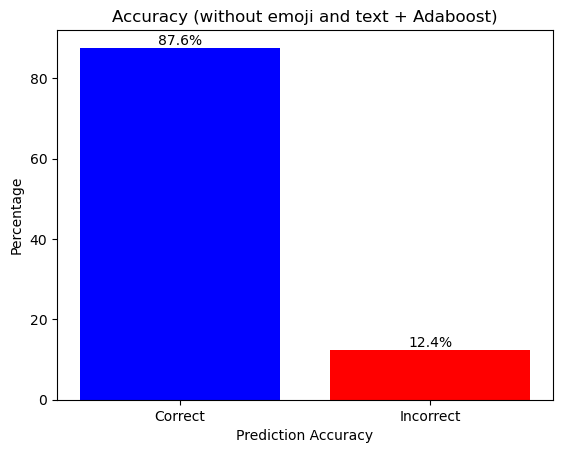

In [31]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred)

# Calculate incorrect predictions
incorrect = 1 - accuracy

# Convert accuracy and incorrect values to percentages
accuracy_percentage = accuracy * 100
incorrect_percentage = incorrect * 100

# Create bar graph
labels = ['Correct', 'Incorrect']
values = [accuracy_percentage, incorrect_percentage]
colors = ['blue', 'red']

plt.bar(labels, values, color=colors)

# Add percentage values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', color='black')

# Set labels and title
plt.xlabel('Prediction Accuracy')
plt.ylabel('Percentage')
plt.title('Accuracy (without emoji and text + Adaboost)')

# Show the graph
plt.show()


In [32]:
from sklearn.metrics import precision_score
precision =precision_score(y_test,y_pred)
print('precision:',precision)

precision: 0.9043988269794722


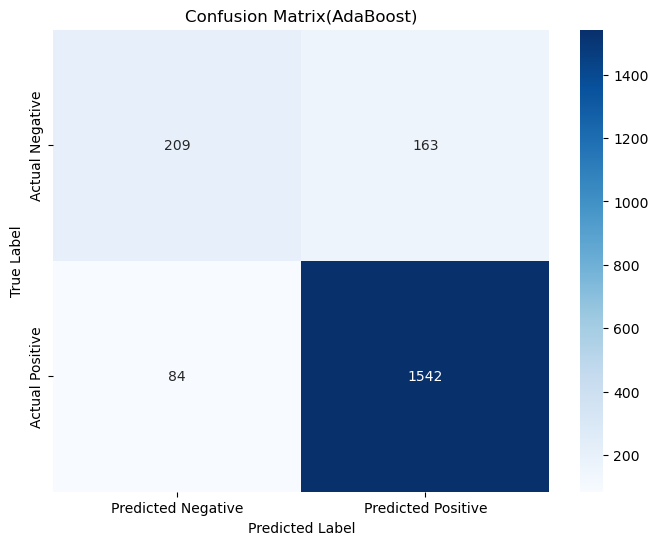

In [33]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')



plt.title("Confusion Matrix(AdaBoost)")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# Xgboost

In [34]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [35]:
from xgboost import XGBClassifier
model = XGBClassifier()  
model.fit(X_train , y_train) 

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [36]:
y_pred = model.predict(X_test)  

In [37]:
from sklearn.metrics import accuracy_score
accuracy =accuracy_score(y_test,y_pred)
print('Accuracy:',accuracy)

Accuracy: 0.9114114114114115


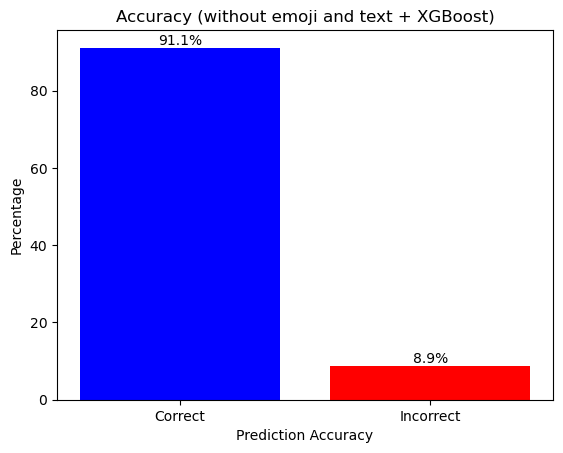

In [38]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred)

# Calculate incorrect predictions
incorrect = 1 - accuracy

# Convert accuracy and incorrect values to percentages
accuracy_percentage = accuracy * 100
incorrect_percentage = incorrect * 100

# Create bar graph
labels = ['Correct', 'Incorrect']
values = [accuracy_percentage, incorrect_percentage]
colors = ['blue', 'red']

plt.bar(labels, values, color=colors)

# Add percentage values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', color='black')

# Set labels and title
plt.xlabel('Prediction Accuracy')
plt.ylabel('Percentage')
plt.title('Accuracy (without emoji and text + XGBoost)')

# Show the graph
plt.show()


In [39]:
from sklearn.metrics import precision_score
precision =precision_score(y_test,y_pred)
print('precision:',precision)

precision: 0.933572710951526


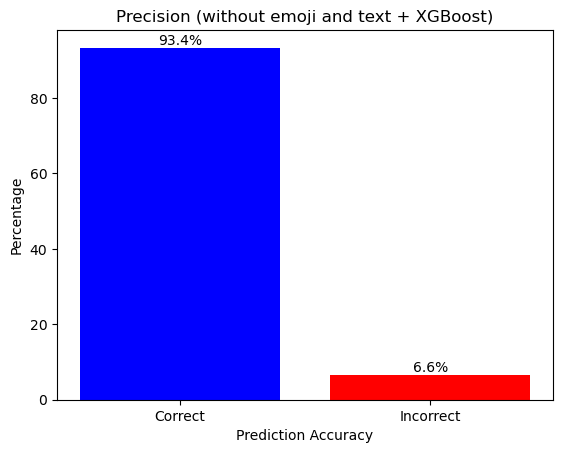

In [40]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score


# Calculate precision score
precision =precision_score(y_test,y_pred)

# Calculate incorrect predictions
incorrect = 1 - precision

# Convert accuracy and incorrect values to percentages
precision_percentage = precision * 100
incorrect_percentage = incorrect * 100

# Create bar graph
labels = ['Correct', 'Incorrect']
values = [precision_percentage, incorrect_percentage]
colors = ['blue', 'red']

plt.bar(labels, values, color=colors)

# Add percentage values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', color='black')

# Set labels and title
plt.xlabel('Prediction Accuracy')
plt.ylabel('Percentage')
plt.title('Precision (without emoji and text + XGBoost)')

# Show the graph
plt.show()


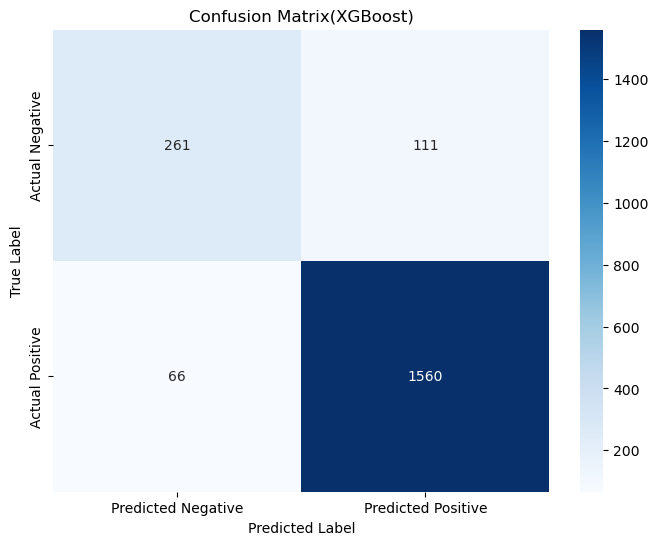

In [45]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')



plt.title("Confusion Matrix(XGBoost)")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# FastText

In [44]:
#https://colab.research.google.com/drive/1xJWdxpT2XQQOZ8sEIQaeDu6eemql5qf4?usp=sharing

# Glove

In [1]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [2]:
data= pd.read_csv('vadar.csv')

reviews=data['comment']

In [3]:
vectorizer = CountVectorizer()

In [4]:
# Fit and transform the reviews into vectors
X = vectorizer.fit_transform(reviews)

In [5]:
# Convert the vector representation to an array
X = X.toarray()

# Create a DataFrame with a single column for storing the review vectors
df = pd.DataFrame({'ReviewVector': X.tolist()})

# Print the DataFrame
print(df)

                                           ReviewVector
0     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
1     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
2     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
3     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
4     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
...                                                 ...
9985  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
9986  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
9987  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
9988  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
9989  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...

[9990 rows x 1 columns]


In [6]:
from sklearn.ensemble import AdaBoostClassifier
# importing train test split funtion
from sklearn.model_selection import train_test_split
#importing metrics module
from sklearn import metrics

In [7]:
import numpy as np
x=np.vstack(df['ReviewVector'].values)

y=data['target']


In [8]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [9]:

#creating adaboost classifier object
ada=AdaBoostClassifier(n_estimators=50,learning_rate=1)
#n_estimators=Number of weak learners to train iteratively
#learning_rate=It contributes to the weights of weak learners.it uses 1 as a default value

In [10]:

#training the model
model=ada.fit(X_train,y_train)

In [11]:

#predict the response for test dataset
y_pred=model.predict(X_test)

In [12]:
from sklearn.metrics import accuracy_score
accuracy =accuracy_score(y_test,y_pred)

print(accuracy)

0.9734734734734735


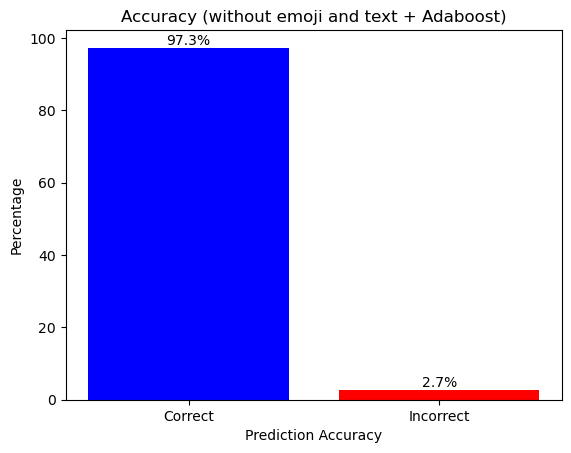

In [13]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred)

# Calculate incorrect predictions
incorrect = 1 - accuracy

# Convert accuracy and incorrect values to percentages
accuracy_percentage = accuracy * 100
incorrect_percentage = incorrect * 100

# Create bar graph
labels = ['Correct', 'Incorrect']
values = [accuracy_percentage, incorrect_percentage]
colors = ['blue', 'red']

plt.bar(labels, values, color=colors)

# Add percentage values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', color='black')

# Set labels and title
plt.xlabel('Prediction Accuracy')
plt.ylabel('Percentage')
plt.title('Accuracy (without emoji and text + Adaboost)')

# Show the graph
plt.show()


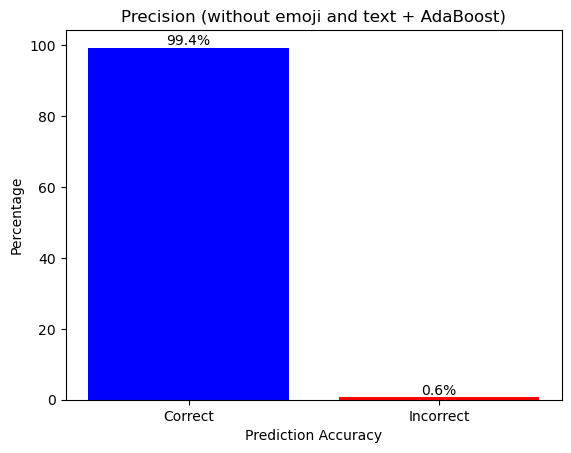

In [14]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score


# Calculate precision score
precision =precision_score(y_test,y_pred)

# Calculate incorrect predictions
incorrect = 1 - precision

# Convert accuracy and incorrect values to percentages
precision_percentage = precision * 100
incorrect_percentage = incorrect * 100

# Create bar graph
labels = ['Correct', 'Incorrect']
values = [precision_percentage, incorrect_percentage]
colors = ['blue', 'red']

plt.bar(labels, values, color=colors)

# Add percentage values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', color='black')

# Set labels and title
plt.xlabel('Prediction Accuracy')
plt.ylabel('Percentage')
plt.title('Precision (without emoji and text + AdaBoost)')

# Show the graph
plt.show()


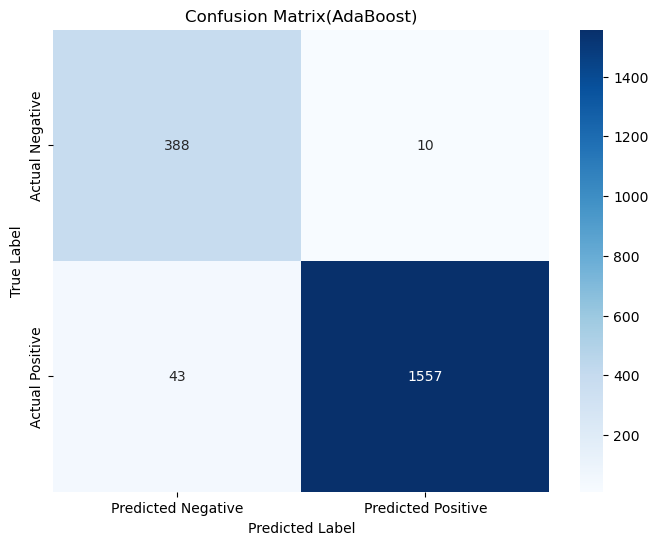

In [23]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')



plt.title("Confusion Matrix(AdaBoost)")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [16]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: xgboost in c:\users\k9875\anaconda\lib\site-packages (1.7.6)




[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [17]:


from xgboost import XGBClassifier


In [18]:
model = XGBClassifier()  
model.fit(X_train , y_train)  
print(model)  


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)


In [19]:
y_prediction = model.predict(X_test)  

In [20]:
from sklearn.metrics import accuracy_score
accuracy =accuracy_score(y_test,y_pred)

print(accuracy)

0.9734734734734735


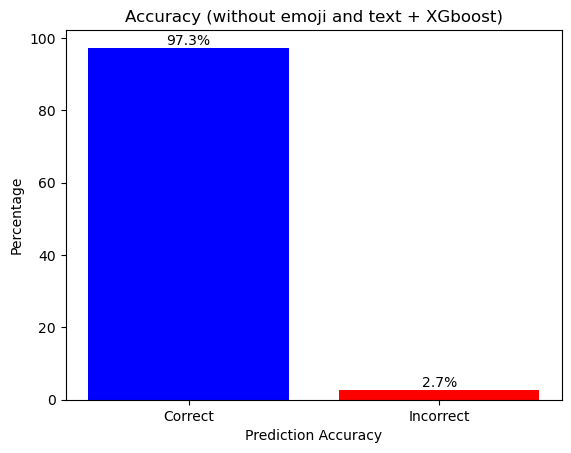

In [21]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred)

# Calculate incorrect predictions
incorrect = 1 - accuracy

# Convert accuracy and incorrect values to percentages
accuracy_percentage = accuracy * 100
incorrect_percentage = incorrect * 100

# Create bar graph
labels = ['Correct', 'Incorrect']
values = [accuracy_percentage, incorrect_percentage]
colors = ['blue', 'red']

plt.bar(labels, values, color=colors)

# Add percentage values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', color='black')

# Set labels and title
plt.xlabel('Prediction Accuracy')
plt.ylabel('Percentage')
plt.title('Accuracy (without emoji and text + XGboost)')

# Show the graph
plt.show()


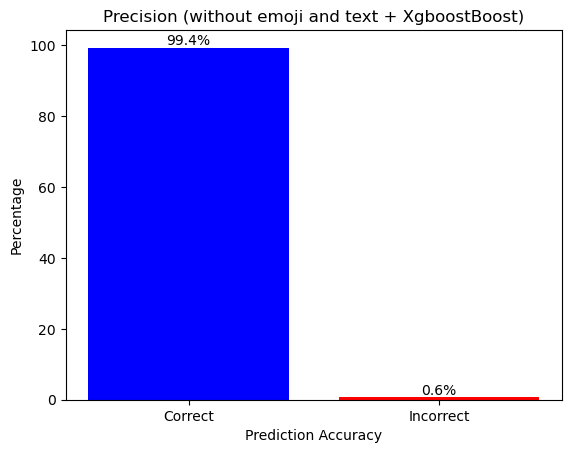

In [22]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score


# Calculate precision score
precision =precision_score(y_test,y_pred)

# Calculate incorrect predictions
incorrect = 1 - precision

# Convert accuracy and incorrect values to percentages
precision_percentage = precision * 100
incorrect_percentage = incorrect * 100

# Create bar graph
labels = ['Correct', 'Incorrect']
values = [precision_percentage, incorrect_percentage]
colors = ['blue', 'red']

plt.bar(labels, values, color=colors)

# Add percentage values on top of bars
for i, v in enumerate(values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom', color='black')

# Set labels and title
plt.xlabel('Prediction Accuracy')
plt.ylabel('Percentage')
plt.title('Precision (without emoji and text + XgboostBoost)')

# Show the graph
plt.show()


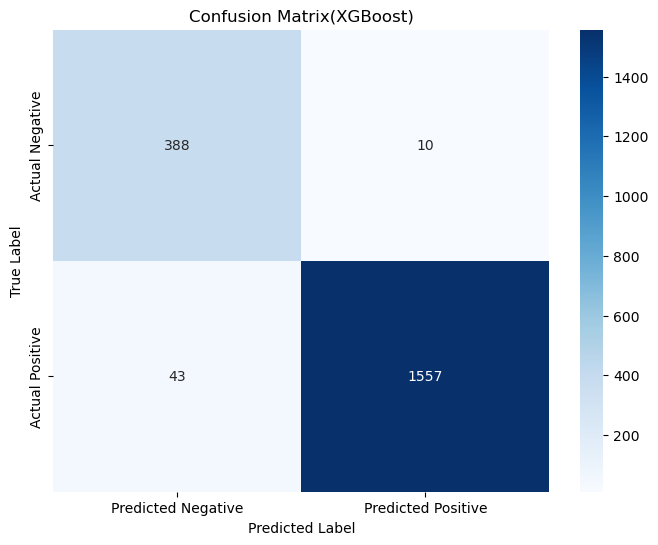

In [24]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])

plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')



plt.title("Confusion Matrix(XGBoost)")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()